Section 1: Data Quality & Overview
-

In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from IPython.display import display
%matplotlib inline


In [8]:
# Set style for visualizations
import seaborn as sns
sns.set_theme(style="whitegrid")  # or "whitegrid", "ticks", etc.


In [4]:
# 1. Data Loading and Basic Info
print("Loading dataset...")
df = pd.read_csv('crop_yield.csv')
print("Dataset loaded successfully!")

Loading dataset...
Dataset loaded successfully!


In [5]:
# Display basic information
print("\n=== Dataset Shape ===")
print(f"Rows: {df.shape[0]}, Columns: {df.shape[1]}")

print("\n=== Dataset Info ===")
display(df.info())

print("\n=== First 5 Rows ===")
display(df.head())

print("\n=== Descriptive Statistics ===")
display(df.describe(include='all'))



=== Dataset Shape ===
Rows: 19689, Columns: 10

=== Dataset Info ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19689 entries, 0 to 19688
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Crop             19689 non-null  object 
 1   Crop_Year        19689 non-null  int64  
 2   Season           19689 non-null  object 
 3   State            19689 non-null  object 
 4   Area             19689 non-null  float64
 5   Production       19689 non-null  int64  
 6   Annual_Rainfall  19689 non-null  float64
 7   Fertilizer       19689 non-null  float64
 8   Pesticide        19689 non-null  float64
 9   Yield            19689 non-null  float64
dtypes: float64(5), int64(2), object(3)
memory usage: 1.5+ MB


None


=== First 5 Rows ===


,Crop,Crop_Year,Season,State,Area,Production,Annual_Rainfall,Fertilizer,Pesticide,Yield
0,Arecanut,1997,Whole Year,Assam,73814.0,56708,2051.4,7024878.38,22882.34,0.796087
1,Arhar/Tur,1997,Kharif,Assam,6637.0,4685,2051.4,631643.29,2057.47,0.710435
2,Castor seed,1997,Kharif,Assam,796.0,22,2051.4,75755.32,246.76,0.238333
3,Coconut,1997,Whole Year,Assam,19656.0,126905000,2051.4,1870661.52,6093.36,5238.051739
4,Cotton(lint),1997,Kharif,Assam,1739.0,794,2051.4,165500.63,539.09,0.420909



=== Descriptive Statistics ===


,Crop,Crop_Year,Season,State,Area,Production,Annual_Rainfall,Fertilizer,Pesticide,Yield
count,19689,19689.000000,19689,19689,1.968900e+04,1.968900e+04,19689.000000,1.968900e+04,1.968900e+04,19689.000000
unique,55,NaN,6,30,NaN,NaN,NaN,NaN,NaN,NaN
top,Rice,NaN,Kharif,Karnataka,NaN,NaN,NaN,NaN,NaN,NaN
freq,1197,NaN,8232,1432,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,2009.127584,NaN,NaN,1.799266e+05,1.643594e+07,1437.755177,2.410331e+07,4.884835e+04,79.954009
std,NaN,6.498099,NaN,NaN,7.328287e+05,2.630568e+08,816.909589,9.494600e+07,2.132874e+05,878.306193
min,NaN,1997.000000,NaN,NaN,5.000000e-01,0.000000e+00,301.300000,5.417000e+01,9.000000e-02,0.000000
25%,NaN,2004.000000,NaN,NaN,1.390000e+03,1.393000e+03,940.700000,1.880146e+05,3.567000e+02,0.600000
50%,NaN,2010.000000,NaN,NaN,9.317000e+03,1.380400e+04,1247.600000,1.234957e+06,2.421900e+03,1.030000
75%,NaN,2015.000000,NaN,NaN,7.511200e+04,1.227180e+05,1643.700000,1.000385e+07,2.004170e+04,2.388889


In [6]:
# Check for missing values
print("\n=== Missing Values Analysis ===")
missing_values = df.isnull().sum()
missing_percent = (df.isnull().sum() / len(df)) * 100
missing_data = pd.DataFrame({'Missing Values': missing_values, 'Percentage (%)': missing_percent})
display(missing_data[missing_data['Missing Values'] > 0])



=== Missing Values Analysis ===


,Missing Values,Percentage (%)


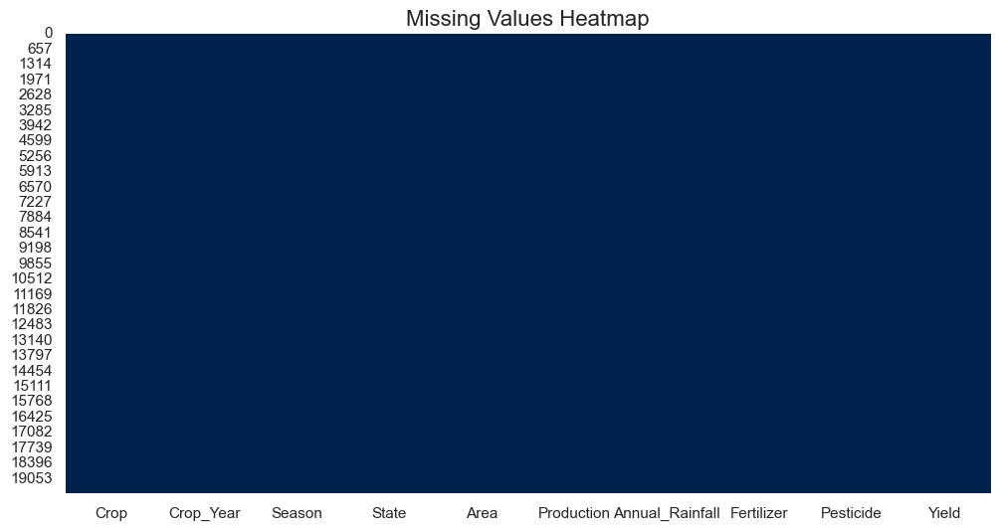

In [13]:
# Visualize missing values
plt.figure(figsize=(12, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='cividis')
plt.title('Missing Values Heatmap', fontsize=16)
plt.show()

In [14]:
# Data types verification
print("\n=== Data Types Verification ===")
data_types = pd.DataFrame(df.dtypes, columns=['Data Type'])
display(data_types)


=== Data Types Verification ===


,Data Type
Crop,object
Crop_Year,int64
Season,object
State,object
Area,float64
Production,int64
Annual_Rainfall,float64
Fertilizer,float64
Pesticide,float64
Yield,float64


In [15]:
# 2. Data Cleaning
print("\n=== Data Cleaning ===")

# Handle missing values (document strategy)
print("\nHandling missing values...")
# For numerical columns, we'll fill with median (less sensitive to outliers)
num_cols = df.select_dtypes(include=['int64', 'float64']).columns
for col in num_cols:
    if df[col].isnull().sum() > 0:
        median_val = df[col].median()
        df[col].fillna(median_val, inplace=True)
        print(f"Filled {col} with median value: {median_val:.2f}")

# For categorical columns, we'll fill with mode
cat_cols = df.select_dtypes(include=['object']).columns
for col in cat_cols:
    if df[col].isnull().sum() > 0:
        mode_val = df[col].mode()[0]
        df[col].fillna(mode_val, inplace=True)
        print(f"Filled {col} with mode value: {mode_val}")

# Verify no missing values remain
print("\nMissing values after cleaning:")
print(df.isnull().sum().sum())

# Remove outliers using IQR method
print("\nRemoving outliers using IQR method...")
num_cols = ['Area', 'Production', 'Annual_Rainfall', 'Fertilizer', 'Pesticide', 'Yield']
for col in num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    before = len(df)
    df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
    after = len(df)
    print(f"Removed {before - after} outliers from {col} ({(before-after)/before*100:.2f}%)")

# Standardize state names and crop names
print("\nStandardizing state and crop names...")
df['State'] = df['State'].str.strip().str.title()
df['Crop'] = df['Crop'].str.strip().str.title()
df['Season'] = df['Season'].str.strip().str.title()

# Create data quality report
print("\n=== Data Quality Report ===")
quality_report = pd.DataFrame({
    'Data Type': df.dtypes,
    'Missing Values': df.isnull().sum(),
    'Unique Values': df.nunique(),
    'Sample Values': [df[col].unique()[:3] for col in df.columns]
})
display(quality_report)

print("\nData cleaning and quality check complete!")


=== Data Cleaning ===

Handling missing values...

Missing values after cleaning:
0

Removing outliers using IQR method...
Removed 3076 outliers from Area (15.62%)
Removed 2358 outliers from Production (14.19%)
Removed 1120 outliers from Annual_Rainfall (7.86%)
Removed 1773 outliers from Fertilizer (13.50%)
Removed 1047 outliers from Pesticide (9.21%)
Removed 1536 outliers from Yield (14.89%)

Standardizing state and crop names...

=== Data Quality Report ===


,Data Type,Missing Values,Unique Values,Sample Values
Crop,object,0,55,"[Arhar/Tur, Castor Seed, Cotton(Lint)]"
Crop_Year,int64,0,24,"[1997, 1998, 1999]"
Season,object,0,6,"[Kharif, Whole Year, Rabi]"
State,object,0,30,"[Assam, Karnataka, West Bengal]"
Area,float64,0,4855,"[6637.0, 796.0, 1739.0]"
Production,int64,0,4466,"[4685, 22, 794]"
Annual_Rainfall,float64,0,565,"[2051.4, 1266.7, 1852.9]"
Fertilizer,float64,0,8049,"[631643.29, 75755.32, 165500.63]"
Pesticide,float64,0,7264,"[2057.47, 246.76, 539.09]"
Yield,float64,0,5025,"[0.710434783, 0.238333333, 0.420909091]"



Data cleaning and quality check complete!


Section 2: Temporal Analysis
-


=== Year-wise Trends Analysis ===


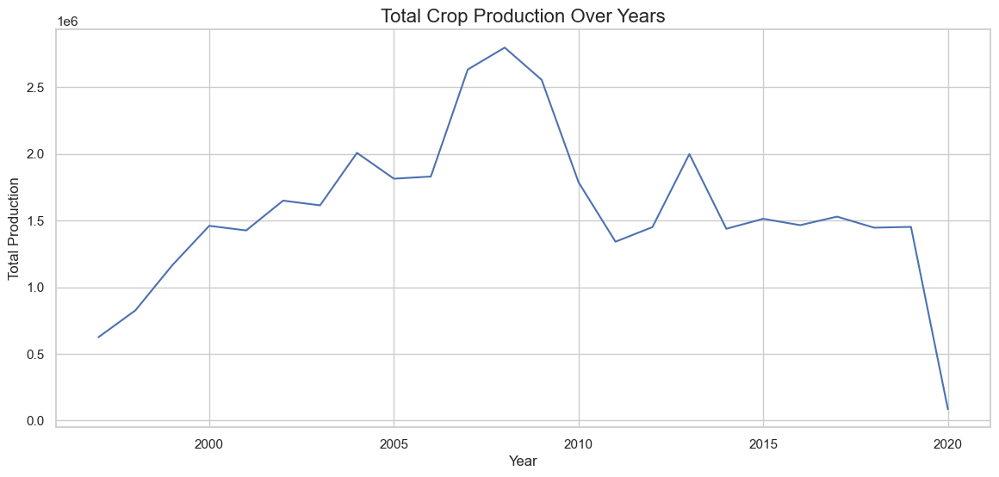

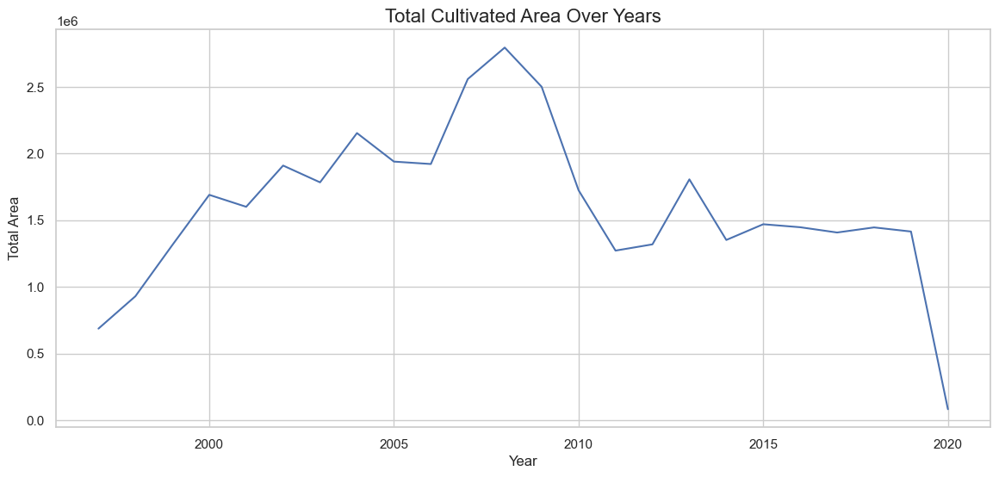

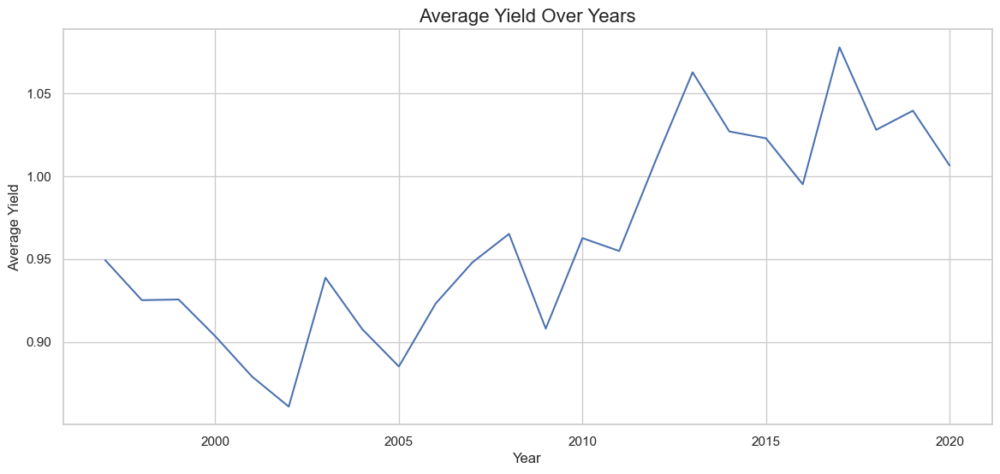

<Figure size 1400x600 with 0 Axes>

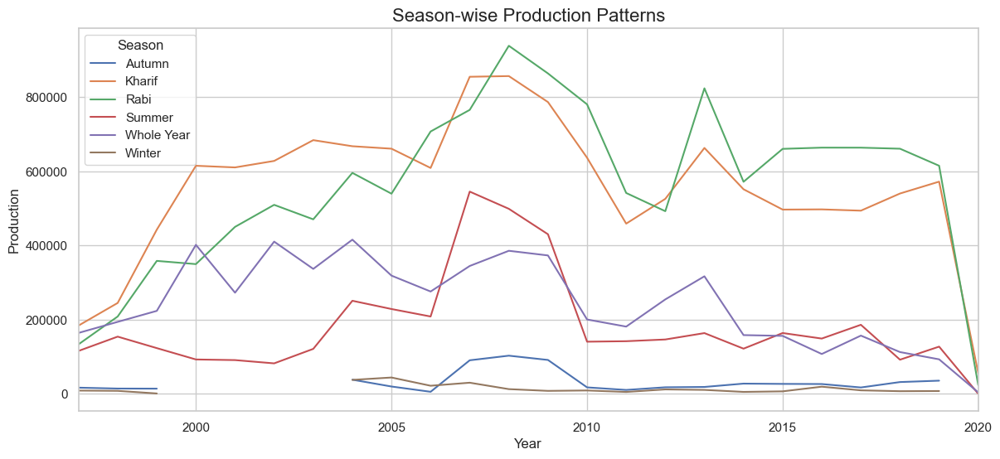

In [16]:
# 3. Year-wise Trends
print("\n=== Year-wise Trends Analysis ===")

# Convert Crop_Year to datetime if needed
df['Crop_Year'] = pd.to_datetime(df['Crop_Year'], format='%Y')

# Total production trends over years
plt.figure(figsize=(14, 6))
yearly_production = df.groupby(df['Crop_Year'].dt.year)['Production'].sum()
sns.lineplot(x=yearly_production.index, y=yearly_production.values)
plt.title('Total Crop Production Over Years', fontsize=16)
plt.xlabel('Year')
plt.ylabel('Total Production')
plt.grid(True)
plt.show()

# Area under cultivation changes
plt.figure(figsize=(14, 6))
yearly_area = df.groupby(df['Crop_Year'].dt.year)['Area'].sum()
sns.lineplot(x=yearly_area.index, y=yearly_area.values)
plt.title('Total Cultivated Area Over Years', fontsize=16)
plt.xlabel('Year')
plt.ylabel('Total Area')
plt.grid(True)
plt.show()

# Yield trends by year
plt.figure(figsize=(14, 6))
yearly_yield = df.groupby(df['Crop_Year'].dt.year)['Yield'].mean()
sns.lineplot(x=yearly_yield.index, y=yearly_yield.values)
plt.title('Average Yield Over Years', fontsize=16)
plt.xlabel('Year')
plt.ylabel('Average Yield')
plt.grid(True)
plt.show()

# Season-wise production patterns
plt.figure(figsize=(14, 6))
seasonal_production = df.groupby(['Crop_Year', 'Season'])['Production'].sum().unstack()
seasonal_production.plot(kind='line', figsize=(14, 6))
plt.title('Season-wise Production Patterns', fontsize=16)
plt.xlabel('Year')
plt.ylabel('Production')
plt.grid(True)
plt.legend(title='Season')
plt.show()





=== Climate Impact Analysis ===


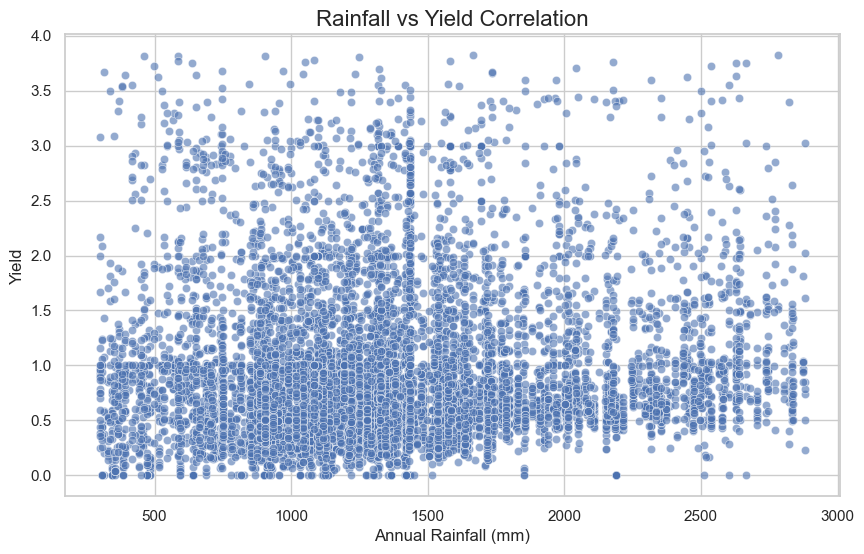

Correlation between Annual Rainfall and Yield: 0.08


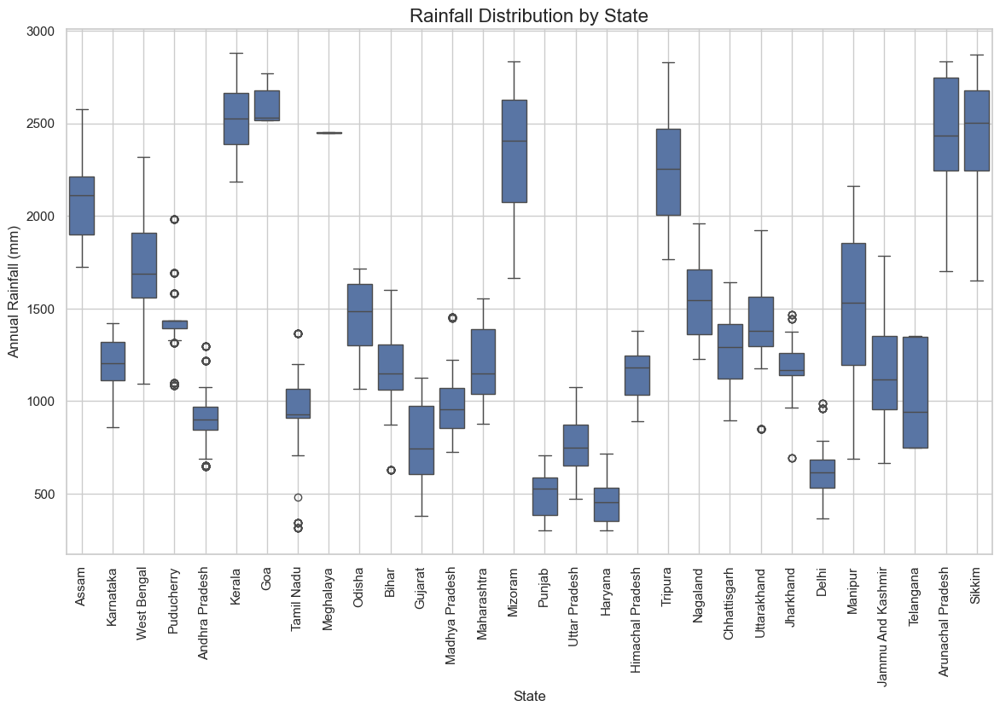

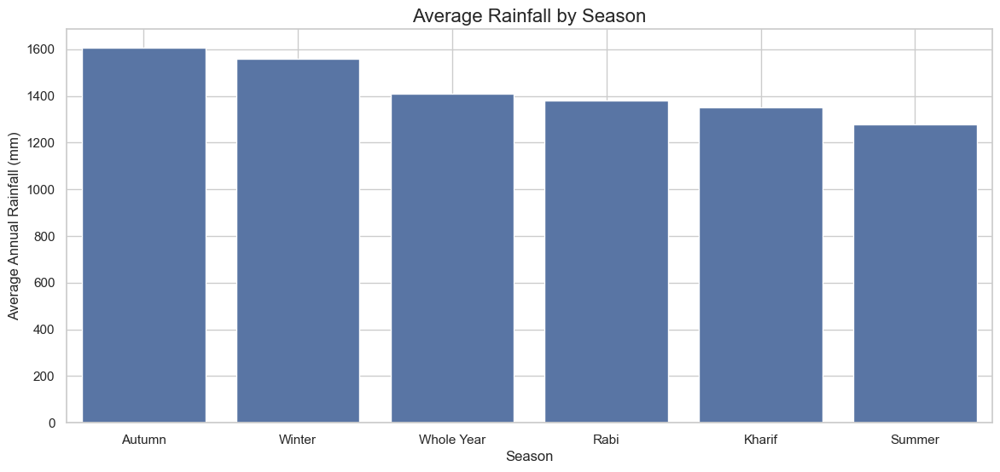

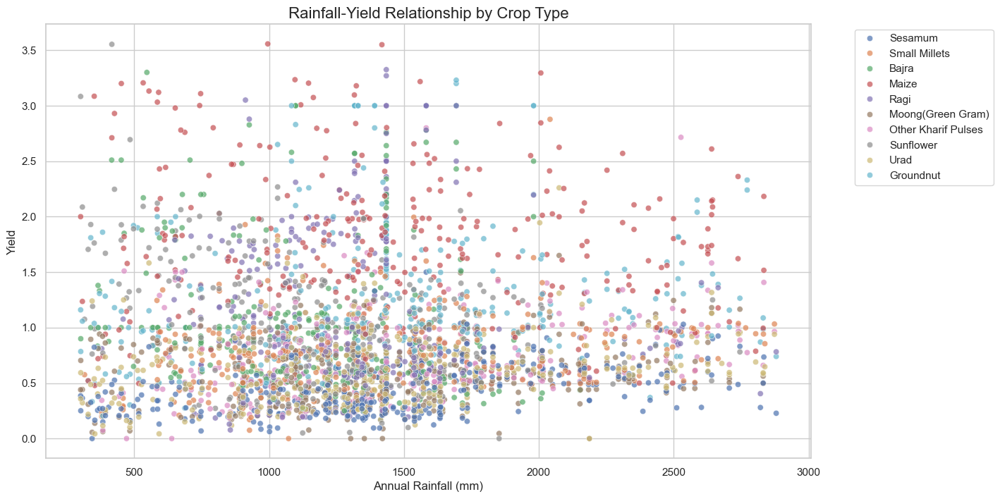

In [18]:
# 4. Climate Impact Analysis
print("\n=== Climate Impact Analysis ===")

# Rainfall vs Yield correlation analysis
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Annual_Rainfall', y='Yield', data=df, alpha=0.6)
plt.title('Rainfall vs Yield Correlation', fontsize=16)
plt.xlabel('Annual Rainfall (mm)')
plt.ylabel('Yield')
plt.grid(True)
plt.show()

# Calculate correlation coefficient
correlation = df[['Annual_Rainfall', 'Yield']].corr().iloc[0,1]
print(f"Correlation between Annual Rainfall and Yield: {correlation:.2f}")

# Rainfall distribution by states
plt.figure(figsize=(14, 8))
sns.boxplot(x='State', y='Annual_Rainfall', data=df)
plt.title('Rainfall Distribution by State', fontsize=16)
plt.xlabel('State')
plt.ylabel('Annual Rainfall (mm)')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()

# Seasonal rainfall patterns
plt.figure(figsize=(14, 6))
seasonal_rainfall = df.groupby('Season')['Annual_Rainfall'].mean().sort_values(ascending=False)
sns.barplot(x=seasonal_rainfall.index, y=seasonal_rainfall.values)
plt.title('Average Rainfall by Season', fontsize=16)
plt.xlabel('Season')
plt.ylabel('Average Annual Rainfall (mm)')
plt.grid(True)
plt.show()

# Climate-yield relationship by crop type
top_crops = df['Crop'].value_counts().nlargest(10).index
plt.figure(figsize=(14, 8))
sns.scatterplot(x='Annual_Rainfall', y='Yield', hue='Crop', 
                data=df[df['Crop'].isin(top_crops)], alpha=0.7)
plt.title('Rainfall-Yield Relationship by Crop Type', fontsize=16)
plt.xlabel('Annual Rainfall (mm)')
plt.ylabel('Yield')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

Section 3: Geographic Analysis
-


=== State-wise Performance Analysis ===


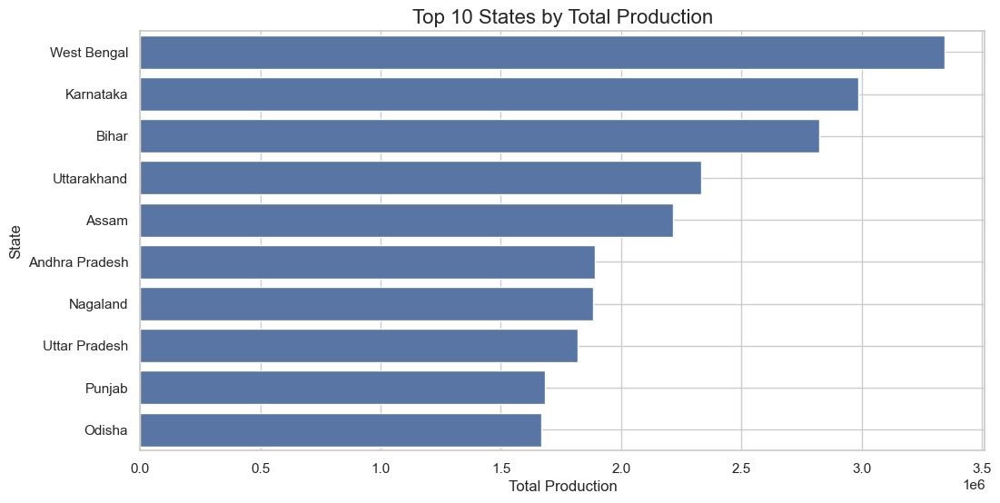

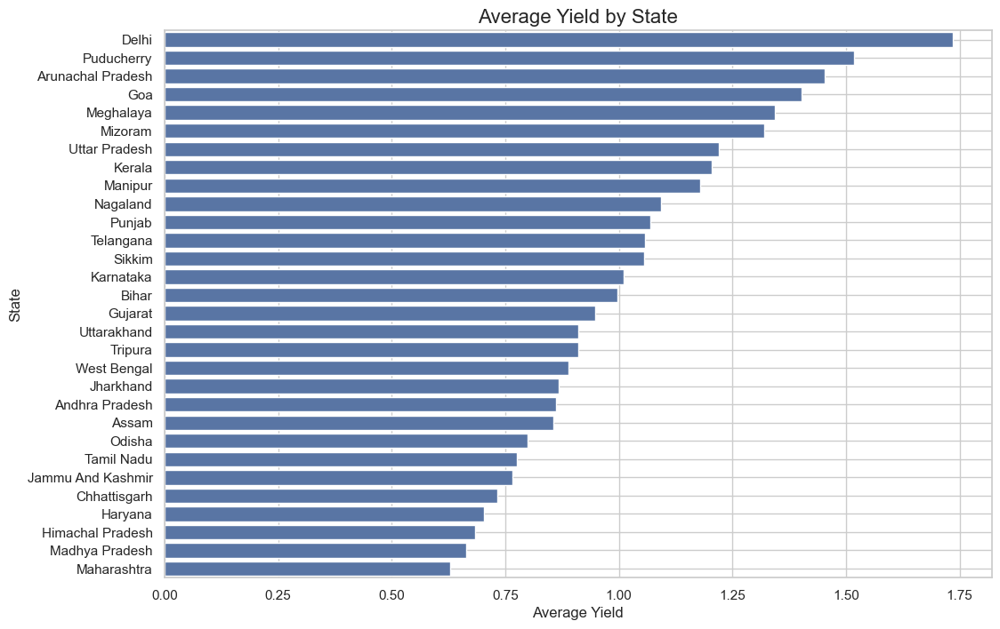

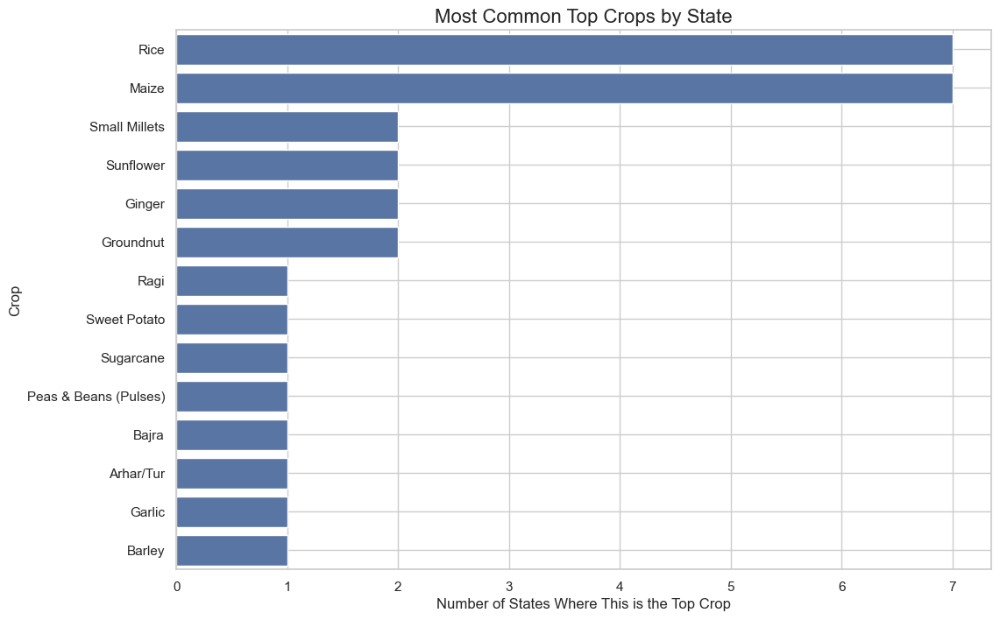

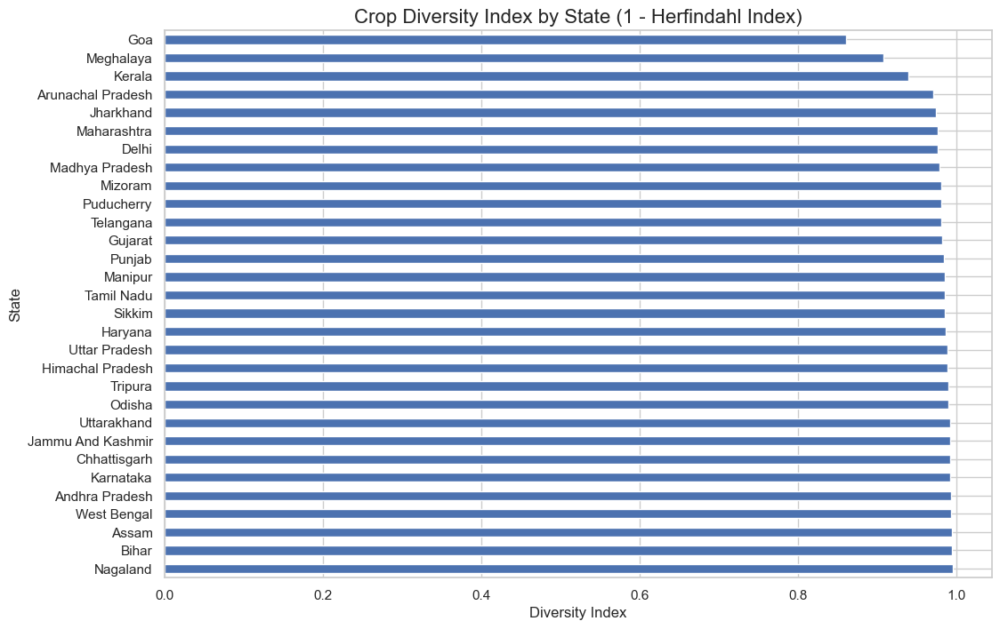

In [19]:
# 5. State-wise Performance
print("\n=== State-wise Performance Analysis ===")

# Top 10 states by total production
plt.figure(figsize=(12, 6))
top_states_prod = df.groupby('State')['Production'].sum().nlargest(10)
sns.barplot(x=top_states_prod.values, y=top_states_prod.index)
plt.title('Top 10 States by Total Production', fontsize=16)
plt.xlabel('Total Production')
plt.ylabel('State')
plt.grid(True)
plt.show()

# State-wise yield comparison
plt.figure(figsize=(12, 8))
state_yield = df.groupby('State')['Yield'].mean().sort_values(ascending=False)
sns.barplot(x=state_yield.values, y=state_yield.index)
plt.title('Average Yield by State', fontsize=16)
plt.xlabel('Average Yield')
plt.ylabel('State')
plt.grid(True)
plt.show()

# Regional crop specialization analysis
# Let's identify the top crop for each state
state_crop_prod = df.groupby(['State', 'Crop'])['Production'].sum().reset_index()
top_crop_per_state = state_crop_prod.loc[state_crop_prod.groupby('State')['Production'].idxmax()]

plt.figure(figsize=(12, 8))
sns.countplot(y='Crop', data=top_crop_per_state, 
              order=top_crop_per_state['Crop'].value_counts().index)
plt.title('Most Common Top Crops by State', fontsize=16)
plt.xlabel('Number of States Where This is the Top Crop')
plt.ylabel('Crop')
plt.grid(True)
plt.show()

# Geographic diversity index calculation (using Herfindahl index)
def calculate_herfindahl(group):
    total = group.sum()
    shares = group / total
    return (shares ** 2).sum()

state_diversity = df.groupby('State')['Production'].apply(calculate_herfindahl)
state_diversity = 1 - state_diversity  # Convert to diversity index (higher = more diverse)

plt.figure(figsize=(12, 8))
state_diversity.sort_values(ascending=False).plot(kind='barh')
plt.title('Crop Diversity Index by State (1 - Herfindahl Index)', fontsize=16)
plt.xlabel('Diversity Index')
plt.ylabel('State')
plt.grid(True)
plt.show()


=== Crop Distribution Analysis ===


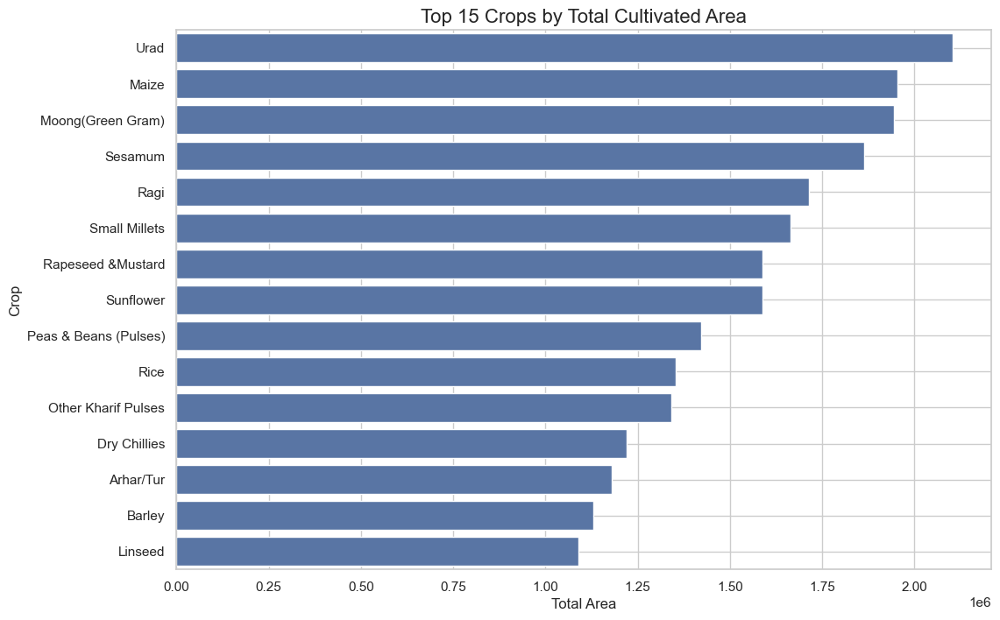

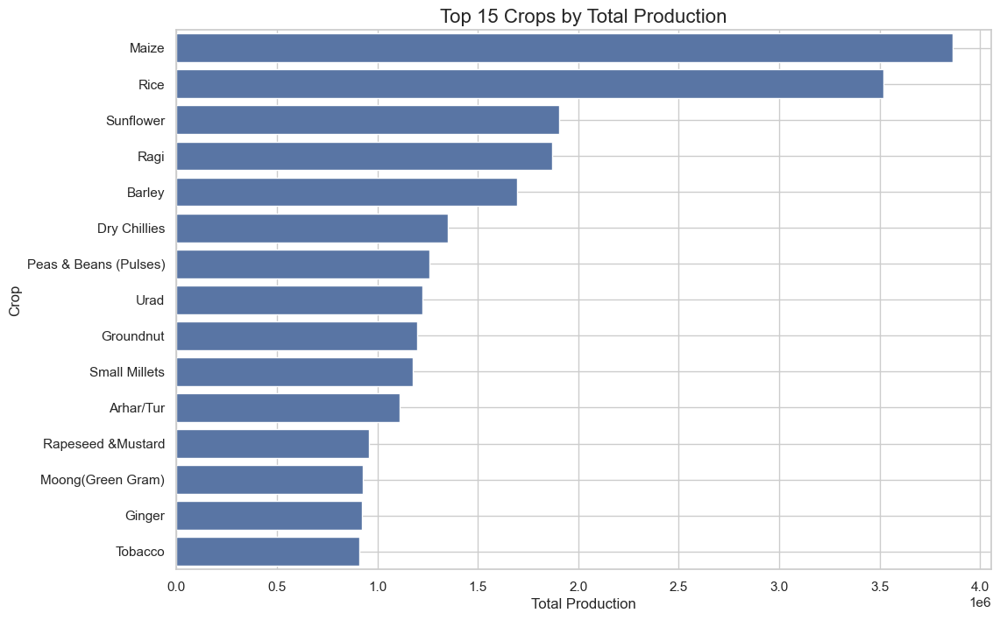

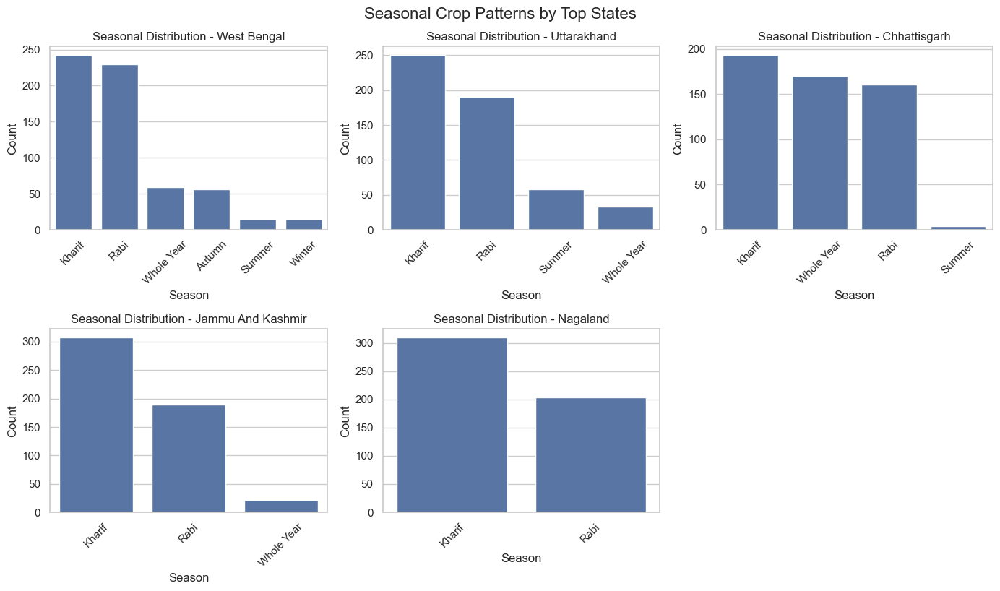

C:\Users\HP\AppData\Local\Temp\ipykernel_4288\2360763206.py:42: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  state_crop_herfindahl = df.groupby('State').apply(lambda x: calculate_herfindahl(x['Production']))


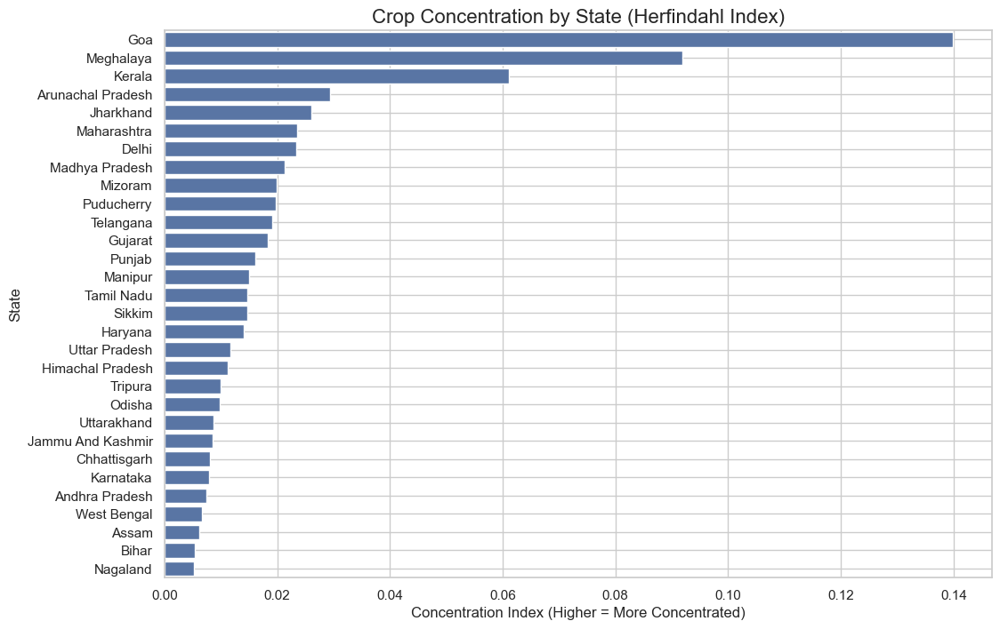

In [20]:
# 6. Crop Distribution Analysis
print("\n=== Crop Distribution Analysis ===")

# Crop-wise area coverage
plt.figure(figsize=(12, 8))
top_crops_area = df.groupby('Crop')['Area'].sum().nlargest(15)
sns.barplot(x=top_crops_area.values, y=top_crops_area.index)
plt.title('Top 15 Crops by Total Cultivated Area', fontsize=16)
plt.xlabel('Total Area')
plt.ylabel('Crop')
plt.grid(True)
plt.show()

# Production volume by crop categories
plt.figure(figsize=(12, 8))
top_crops_prod = df.groupby('Crop')['Production'].sum().nlargest(15)
sns.barplot(x=top_crops_prod.values, y=top_crops_prod.index)
plt.title('Top 15 Crops by Total Production', fontsize=16)
plt.xlabel('Total Production')
plt.ylabel('Crop')
plt.grid(True)
plt.show()

# Seasonal crop patterns by state
# Let's look at seasonal distribution for top 5 states
top_states = df['State'].value_counts().nlargest(5).index

plt.figure(figsize=(14, 8))
for i, state in enumerate(top_states, 1):
    plt.subplot(2, 3, i)
    state_data = df[df['State'] == state]
    seasonal_dist = state_data['Season'].value_counts()
    sns.barplot(x=seasonal_dist.index, y=seasonal_dist.values)
    plt.title(f'Seasonal Distribution - {state}')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
plt.tight_layout()
plt.suptitle('Seasonal Crop Patterns by Top States', y=1.02, fontsize=16)
plt.show()

# Crop concentration analysis (Herfindahl index)
state_crop_herfindahl = df.groupby('State').apply(lambda x: calculate_herfindahl(x['Production']))
state_crop_herfindahl = pd.DataFrame(state_crop_herfindahl, columns=['Concentration_Index'])

plt.figure(figsize=(12, 8))
sns.barplot(x=state_crop_herfindahl['Concentration_Index'], 
            y=state_crop_herfindahl.index,
            order=state_crop_herfindahl.sort_values('Concentration_Index', ascending=False).index)
plt.title('Crop Concentration by State (Herfindahl Index)', fontsize=16)
plt.xlabel('Concentration Index (Higher = More Concentrated)')
plt.ylabel('State')
plt.grid(True)
plt.show()

Section 4: Input Analysis (Critical for Carbon Footprint)
-


=== Fertilizer Usage Analysis ===


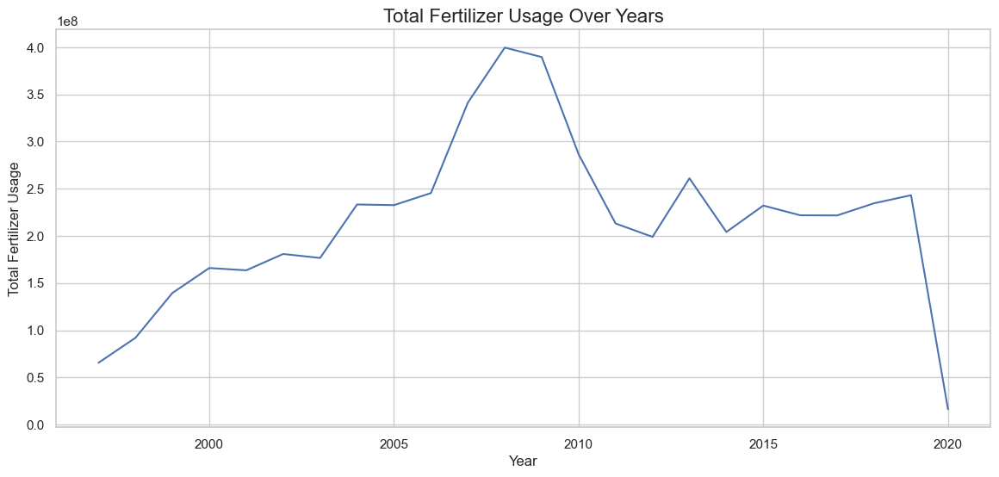

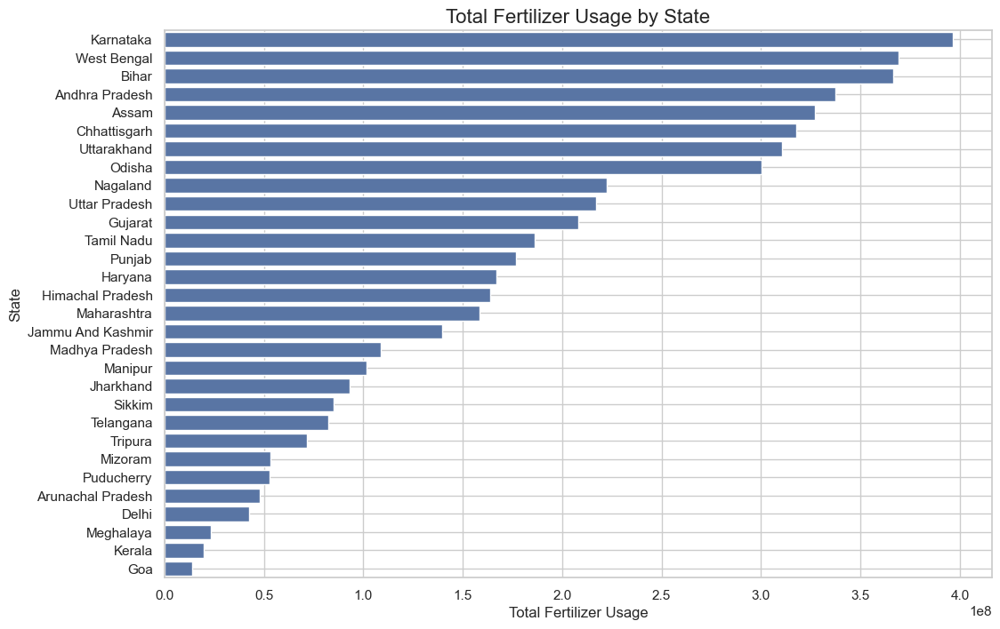

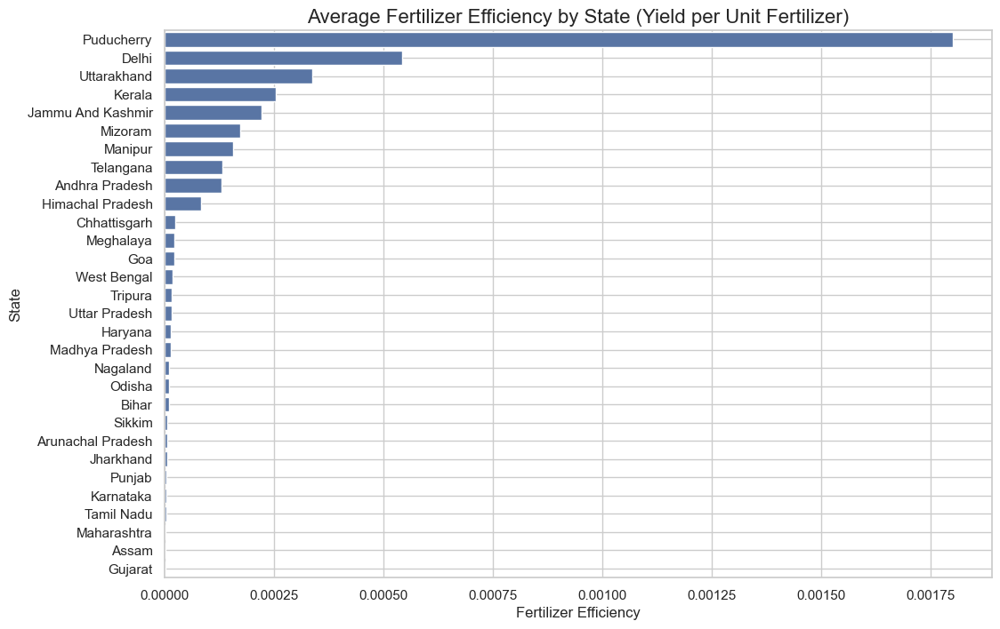

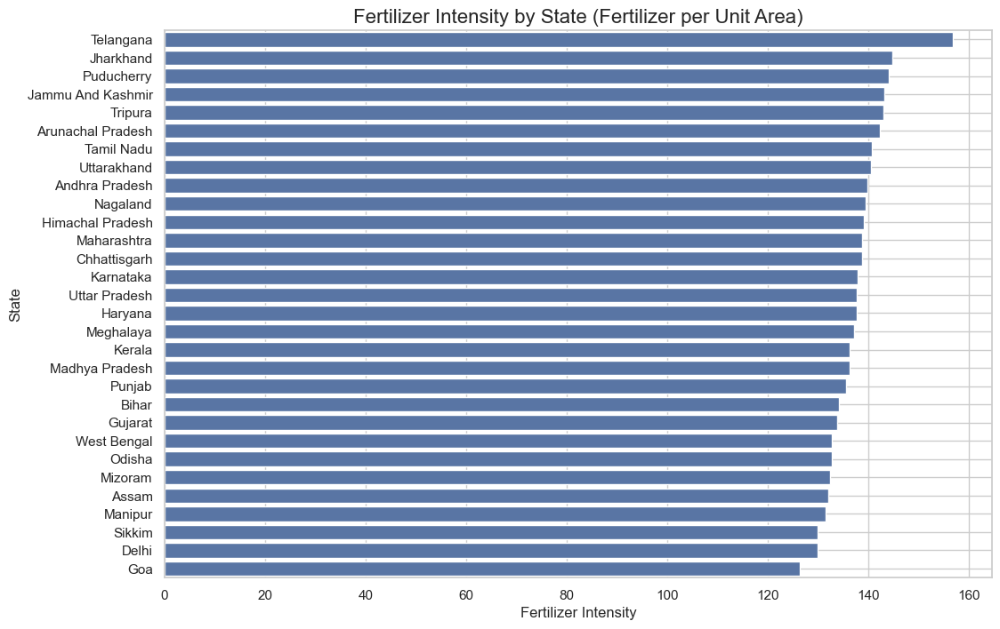

In [21]:
# 7. Fertilizer Usage Analysis
print("\n=== Fertilizer Usage Analysis ===")

# Fertilizer usage trends over time
plt.figure(figsize=(14, 6))
yearly_fert = df.groupby(df['Crop_Year'].dt.year)['Fertilizer'].sum()
sns.lineplot(x=yearly_fert.index, y=yearly_fert.values)
plt.title('Total Fertilizer Usage Over Years', fontsize=16)
plt.xlabel('Year')
plt.ylabel('Total Fertilizer Usage')
plt.grid(True)
plt.show()

# State-wise fertilizer intensity
plt.figure(figsize=(12, 8))
state_fert = df.groupby('State')['Fertilizer'].sum().sort_values(ascending=False)
sns.barplot(x=state_fert.values, y=state_fert.index)
plt.title('Total Fertilizer Usage by State', fontsize=16)
plt.xlabel('Total Fertilizer Usage')
plt.ylabel('State')
plt.grid(True)
plt.show()

# Fertilizer efficiency (Fertilizer per unit yield)
df['Fertilizer_Efficiency'] = df['Yield'] / df['Fertilizer']

plt.figure(figsize=(12, 8))
fert_efficiency = df.groupby('State')['Fertilizer_Efficiency'].mean().sort_values(ascending=False)
sns.barplot(x=fert_efficiency.values, y=fert_efficiency.index)
plt.title('Average Fertilizer Efficiency by State (Yield per Unit Fertilizer)', fontsize=16)
plt.xlabel('Fertilizer Efficiency')
plt.ylabel('State')
plt.grid(True)
plt.show()

# High vs low fertilizer usage regions
df['Fertilizer_Intensity'] = df['Fertilizer'] / df['Area']

plt.figure(figsize=(12, 8))
fert_intensity = df.groupby('State')['Fertilizer_Intensity'].mean().sort_values(ascending=False)
sns.barplot(x=fert_intensity.values, y=fert_intensity.index)
plt.title('Fertilizer Intensity by State (Fertilizer per Unit Area)', fontsize=16)
plt.xlabel('Fertilizer Intensity')
plt.ylabel('State')
plt.grid(True)
plt.show()


=== Pesticide Usage Analysis ===


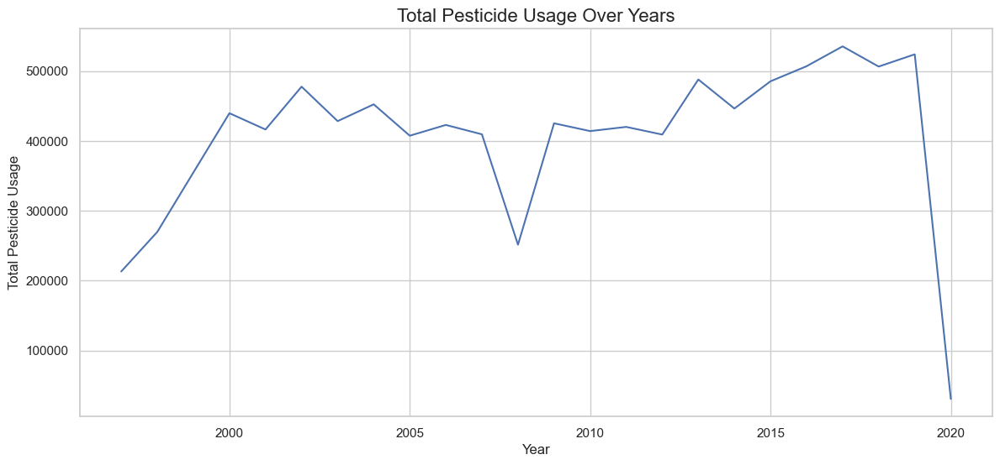

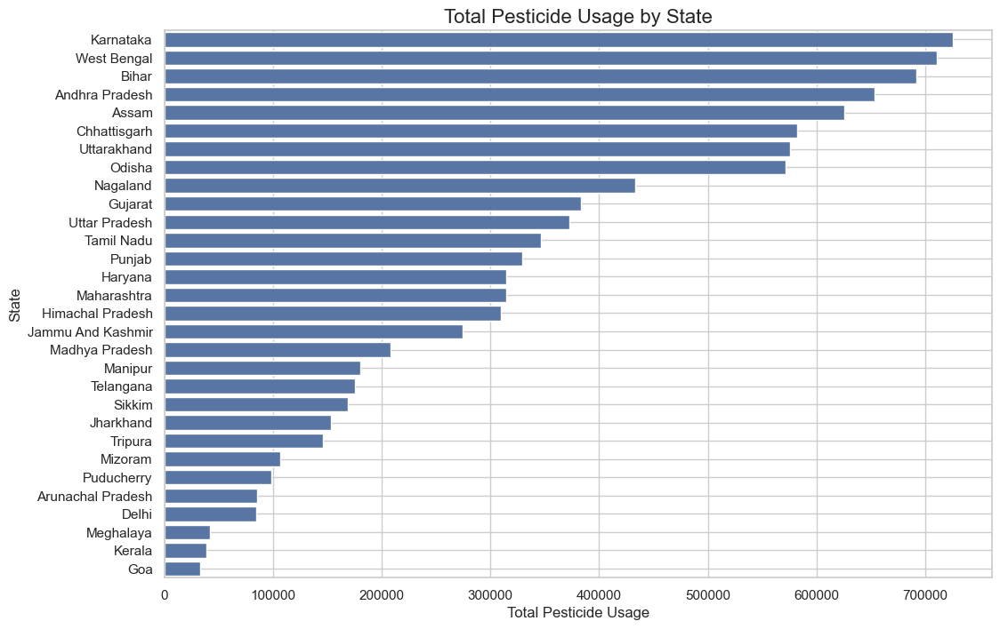

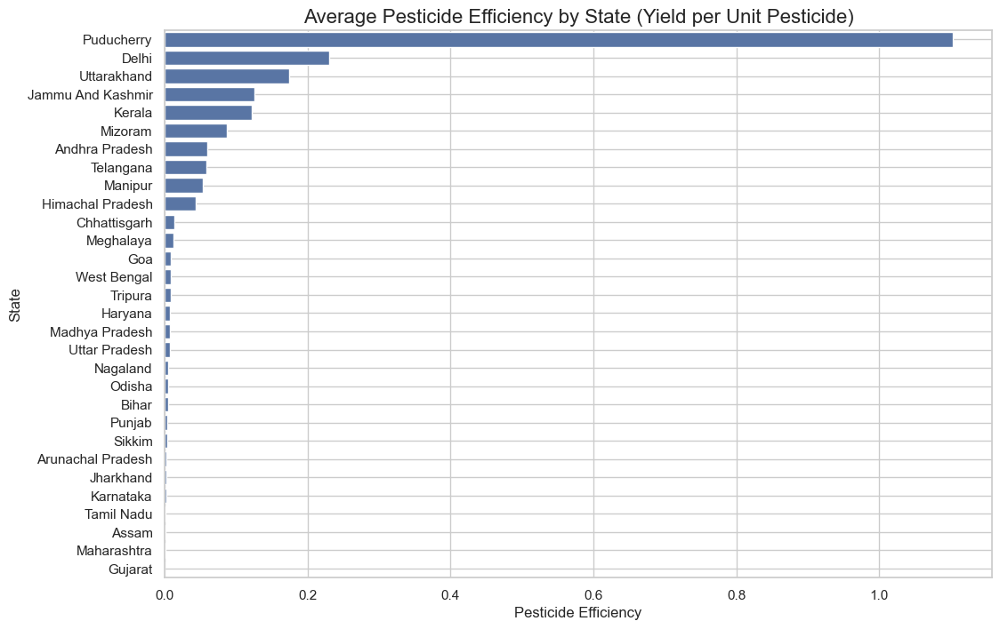

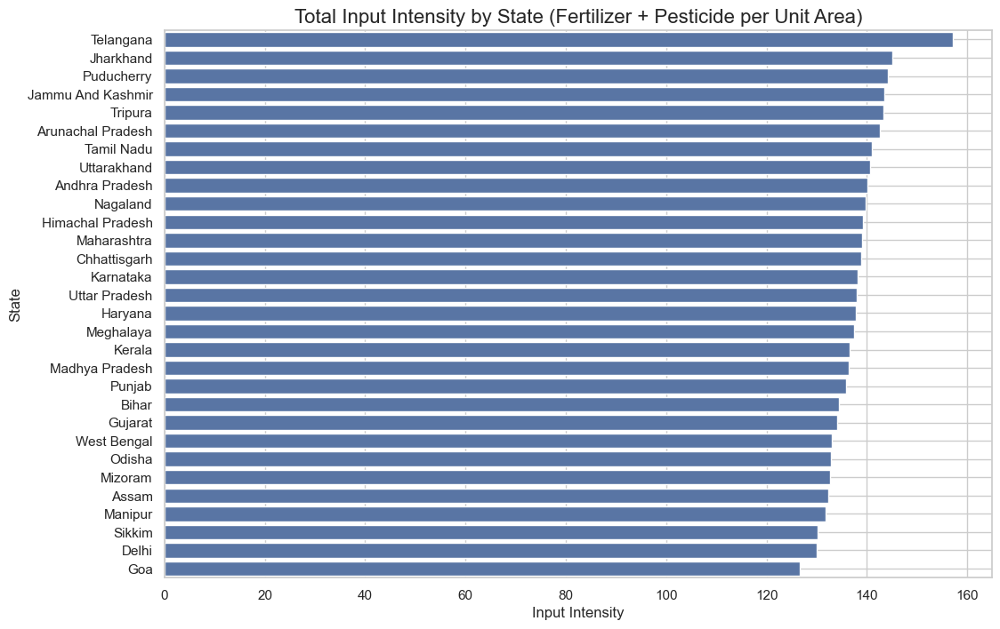

In [22]:
# 8. Pesticide Usage Analysis
print("\n=== Pesticide Usage Analysis ===")

# Pesticide usage trends over time
plt.figure(figsize=(14, 6))
yearly_pest = df.groupby(df['Crop_Year'].dt.year)['Pesticide'].sum()
sns.lineplot(x=yearly_pest.index, y=yearly_pest.values)
plt.title('Total Pesticide Usage Over Years', fontsize=16)
plt.xlabel('Year')
plt.ylabel('Total Pesticide Usage')
plt.grid(True)
plt.show()

# State-wise pesticide usage
plt.figure(figsize=(12, 8))
state_pest = df.groupby('State')['Pesticide'].sum().sort_values(ascending=False)
sns.barplot(x=state_pest.values, y=state_pest.index)
plt.title('Total Pesticide Usage by State', fontsize=16)
plt.xlabel('Total Pesticide Usage')
plt.ylabel('State')
plt.grid(True)
plt.show()

# Pesticide efficiency metrics
df['Pesticide_Efficiency'] = df['Yield'] / df['Pesticide']

plt.figure(figsize=(12, 8))
pest_efficiency = df.groupby('State')['Pesticide_Efficiency'].mean().sort_values(ascending=False)
sns.barplot(x=pest_efficiency.values, y=pest_efficiency.index)
plt.title('Average Pesticide Efficiency by State (Yield per Unit Pesticide)', fontsize=16)
plt.xlabel('Pesticide Efficiency')
plt.ylabel('State')
plt.grid(True)
plt.show()

# Environmental impact indicators
# Calculate input intensity ratios
df['Input_Intensity'] = (df['Fertilizer'] + df['Pesticide']) / df['Area']

plt.figure(figsize=(12, 8))
input_intensity = df.groupby('State')['Input_Intensity'].mean().sort_values(ascending=False)
sns.barplot(x=input_intensity.values, y=input_intensity.index)
plt.title('Total Input Intensity by State (Fertilizer + Pesticide per Unit Area)', fontsize=16)
plt.xlabel('Input Intensity')
plt.ylabel('State')
plt.grid(True)
plt.show()


=== Input-Output Relationships ===


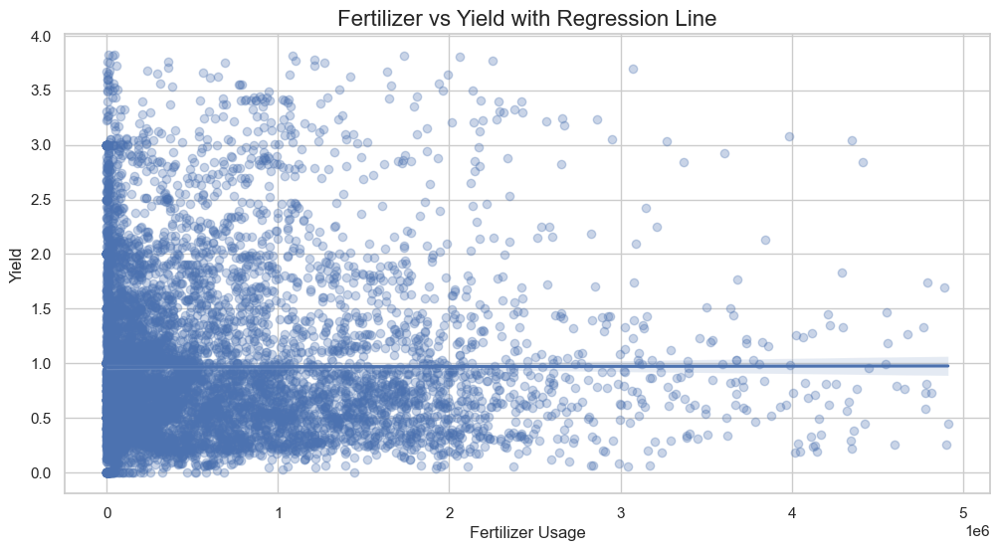

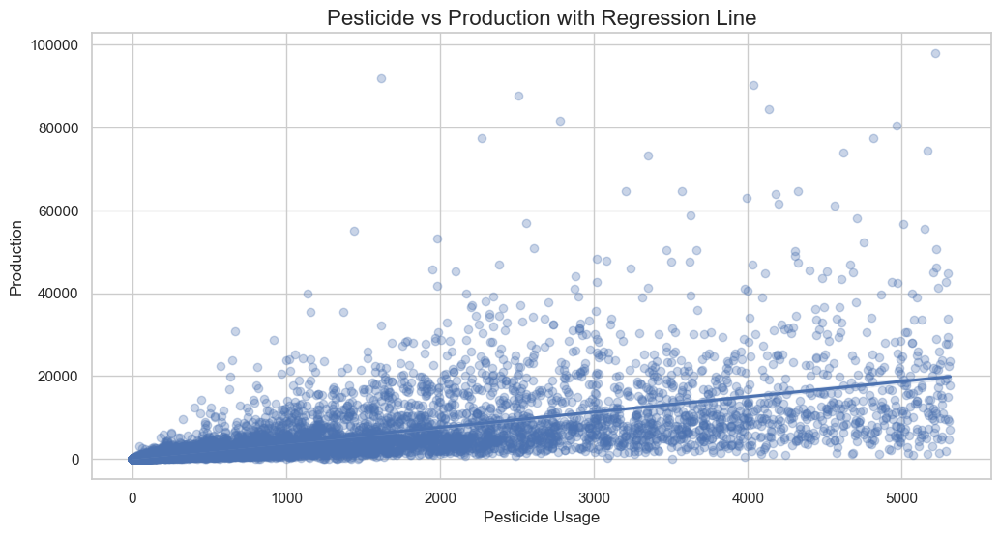


Top 5 States by Resource Efficiency (Yield per Unit Input):


State
Puducherry           0.001801
Delhi                0.000544
Uttarakhand          0.000337
Kerala               0.000254
Jammu And Kashmir    0.000222
Name: Fertilizer_Efficiency, dtype: float64


Bottom 5 States by Resource Efficiency (Yield per Unit Input):


State
Gujarat        0.000001
Assam          0.000002
Maharashtra    0.000002
Tamil Nadu     0.000004
Karnataka      0.000004
Name: Fertilizer_Efficiency, dtype: float64

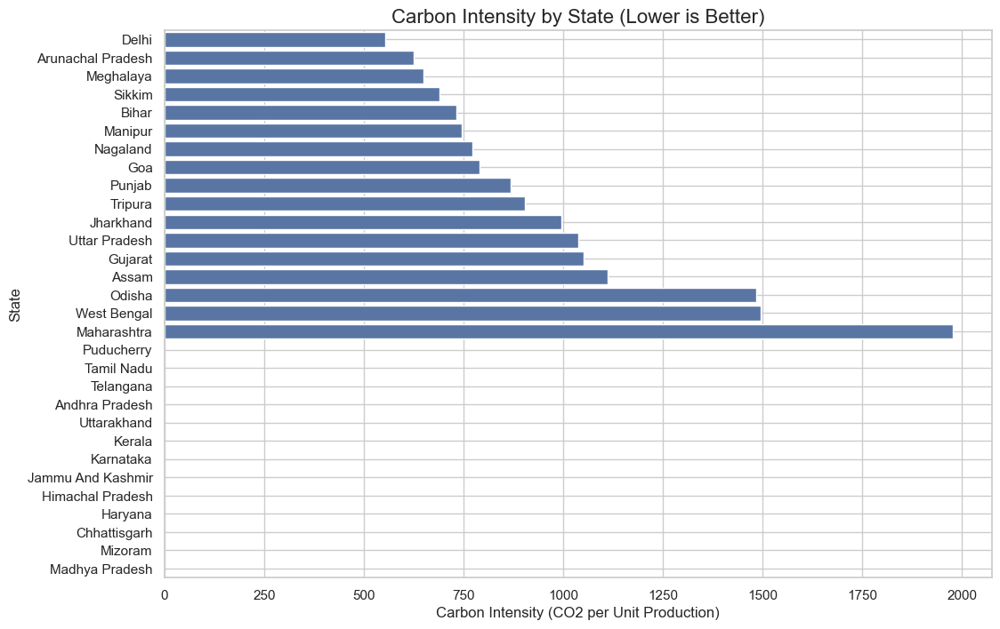

In [23]:
# 9. Input-Output Relationships
print("\n=== Input-Output Relationships ===")

# Fertilizer vs Yield scatter plots with regression
plt.figure(figsize=(12, 6))
sns.regplot(x='Fertilizer', y='Yield', data=df, scatter_kws={'alpha':0.3})
plt.title('Fertilizer vs Yield with Regression Line', fontsize=16)
plt.xlabel('Fertilizer Usage')
plt.ylabel('Yield')
plt.grid(True)
plt.show()

# Pesticide vs Production analysis
plt.figure(figsize=(12, 6))
sns.regplot(x='Pesticide', y='Production', data=df, scatter_kws={'alpha':0.3})
plt.title('Pesticide vs Production with Regression Line', fontsize=16)
plt.xlabel('Pesticide Usage')
plt.ylabel('Production')
plt.grid(True)
plt.show()

# Resource efficiency metrics
# Calculate multiple efficiency metrics
df['Input_Output_Ratio'] = (df['Fertilizer'] + df['Pesticide']) / df['Production']
df['Water_Productivity'] = df['Production'] / df['Annual_Rainfall']  # Proxy for water productivity

# Display top and bottom states by resource efficiency
print("\nTop 5 States by Resource Efficiency (Yield per Unit Input):")
display(df.groupby('State')['Fertilizer_Efficiency'].mean().nlargest(5))

print("\nBottom 5 States by Resource Efficiency (Yield per Unit Input):")
display(df.groupby('State')['Fertilizer_Efficiency'].mean().nsmallest(5))

# Sustainability indicators calculation
# Calculate carbon intensity (proxy using fertilizer as it's a major source of emissions)
# Assuming 1 unit fertilizer = 5 units CO2 equivalent (simplified for illustration)
df['Carbon_Intensity'] = (df['Fertilizer'] * 5) / df['Production']

plt.figure(figsize=(12, 8))
carbon_intensity = df.groupby('State')['Carbon_Intensity'].mean().sort_values()
sns.barplot(x=carbon_intensity.values, y=carbon_intensity.index)
plt.title('Carbon Intensity by State (Lower is Better)', fontsize=16)
plt.xlabel('Carbon Intensity (CO2 per Unit Production)')
plt.ylabel('State')
plt.grid(True)
plt.show()

Section 5: Sustainability Insights
-


=== Efficiency Metrics Analysis ===


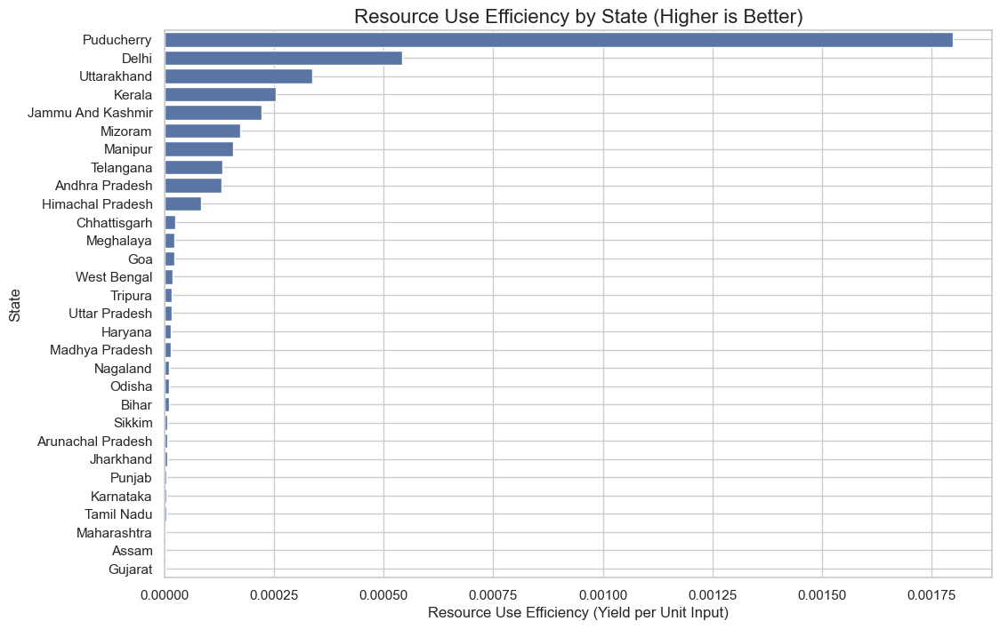

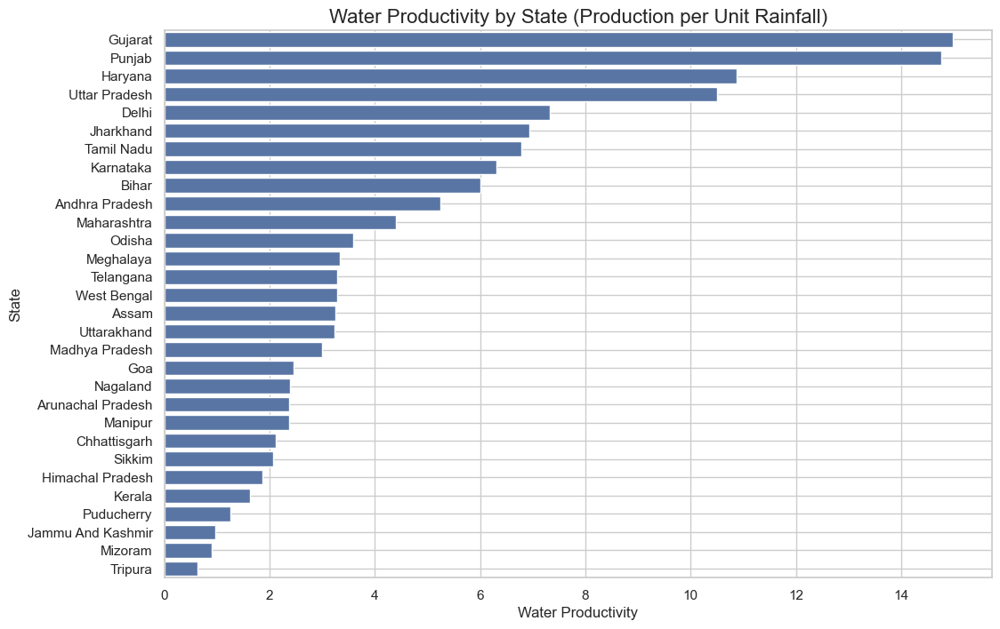

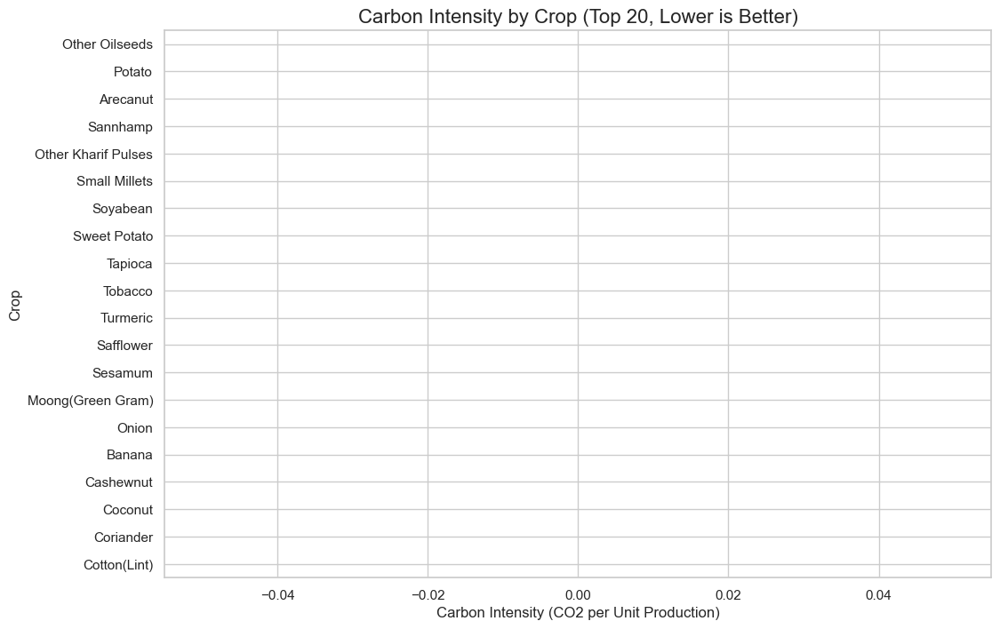

In [24]:
# 10. Efficiency Metrics
print("\n=== Efficiency Metrics Analysis ===")

# Resource Use Efficiency (RUE) calculation
# We'll define RUE as (Yield) / (Fertilizer + Pesticide)
df['RUE'] = df['Yield'] / (df['Fertilizer'] + df['Pesticide'])

plt.figure(figsize=(12, 8))
rue_by_state = df.groupby('State')['RUE'].mean().sort_values(ascending=False)
sns.barplot(x=rue_by_state.values, y=rue_by_state.index)
plt.title('Resource Use Efficiency by State (Higher is Better)', fontsize=16)
plt.xlabel('Resource Use Efficiency (Yield per Unit Input)')
plt.ylabel('State')
plt.grid(True)
plt.show()

# Water productivity (using rainfall as proxy)
plt.figure(figsize=(12, 8))
water_prod = df.groupby('State')['Water_Productivity'].mean().sort_values(ascending=False)
sns.barplot(x=water_prod.values, y=water_prod.index)
plt.title('Water Productivity by State (Production per Unit Rainfall)', fontsize=16)
plt.xlabel('Water Productivity')
plt.ylabel('State')
plt.grid(True)
plt.show()

# Carbon intensity estimation (fertilizer-based)
plt.figure(figsize=(12, 8))
carbon_intensity = df.groupby('Crop')['Carbon_Intensity'].mean().sort_values().nlargest(20)
sns.barplot(x=carbon_intensity.values, y=carbon_intensity.index)
plt.title('Carbon Intensity by Crop (Top 20, Lower is Better)', fontsize=16)
plt.xlabel('Carbon Intensity (CO2 per Unit Production)')
plt.ylabel('Crop')
plt.grid(True)
plt.show()


=== Sustainability Classification ===


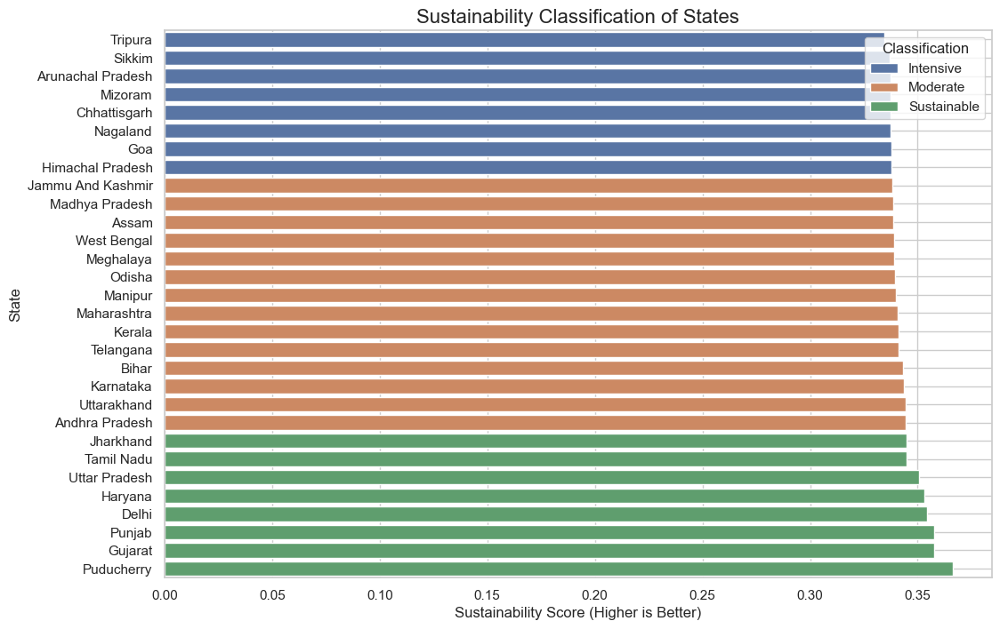


Top 5 Most Sustainable States:


State
Puducherry    0.366186
Gujarat       0.357791
Punjab        0.357508
Delhi         0.354528
Haryana       0.353083
Name: Sustainability_Score, dtype: float64


Top 5 Most Intensive States:


State
Tripura              0.334623
Sikkim               0.336798
Arunachal Pradesh    0.337316
Mizoram              0.337328
Chhattisgarh         0.337364
Name: Sustainability_Score, dtype: float64


Benchmark Comparison:


,Yield,Fertilizer,Pesticide,RUE,Carbon_Intensity
Sustainable States,1.146375,615386.180008,1120.856387,0.000531,inf
Intensive States,0.951101,410602.405653,784.886966,0.000048,inf
All States Average,0.967723,587741.773863,1108.728456,0.000178,inf


In [27]:
# 11. Sustainability Classification
print("\n=== Sustainability Classification ===")

# Create sustainability score for each record
# We'll combine multiple metrics: RUE, Water Productivity, and inverse of Carbon Intensity
# Normalize each metric first
df['RUE_norm'] = (df['RUE'] - df['RUE'].min()) / (df['RUE'].max() - df['RUE'].min())
df['Water_Prod_norm'] = (df['Water_Productivity'] - df['Water_Productivity'].min()) / \
                        (df['Water_Productivity'].max() - df['Water_Productivity'].min())
df['Carbon_Intensity_norm'] = 1 - ((df['Carbon_Intensity'] - df['Carbon_Intensity'].min()) / 
                                  (df['Carbon_Intensity'].max() - df['Carbon_Intensity'].min()))

# Calculate composite sustainability score (equal weights)
df['Sustainability_Score'] = (df['RUE_norm'] + df['Water_Prod_norm'] + df['Carbon_Intensity_norm']) / 3

# Classify states as sustainable/moderate/intensive
state_sustainability = df.groupby('State')['Sustainability_Score'].mean()

# Define classification thresholds
sustainable_threshold = state_sustainability.quantile(0.75)
moderate_threshold = state_sustainability.quantile(0.25)

state_classification = pd.cut(state_sustainability, 
                             bins=[-np.inf, moderate_threshold, sustainable_threshold, np.inf],
                             labels=['Intensive', 'Moderate', 'Sustainable'])

# Visualize sustainability classification
plt.figure(figsize=(12, 8))
sns.barplot(x=state_sustainability.sort_values().values, 
            y=state_sustainability.sort_values().index,
            hue=state_classification[state_sustainability.sort_values().index],
            dodge=False)
plt.title('Sustainability Classification of States', fontsize=16)
plt.xlabel('Sustainability Score (Higher is Better)')
plt.ylabel('State')
plt.legend(title='Classification')
plt.grid(True)
plt.show()

# Identify best practices examples
print("\nTop 5 Most Sustainable States:")
display(state_sustainability.nlargest(5))

print("\nTop 5 Most Intensive States:")
display(state_sustainability.nsmallest(5))

# First, ensure the columns are numeric
numeric_cols = ['Yield', 'Fertilizer', 'Pesticide', 'RUE', 'Carbon_Intensity']
for col in numeric_cols:
    df[col] = pd.to_numeric(df[col], errors='coerce')  # Convert to numeric, non-convertible becomes NaN

# Now proceed with the benchmark comparison
benchmark_comparison = pd.DataFrame({
    'Sustainable States': df[df['State'].isin(sustainable_states)][numeric_cols].mean(),
    'Intensive States': df[df['State'].isin(intensive_states)][numeric_cols].mean(),
    'All States Average': df[numeric_cols].mean()
}).T

print("\nBenchmark Comparison:")
display(benchmark_comparison)

Section 6: Advanced Visualizations
-


=== Interactive Visualizations ===


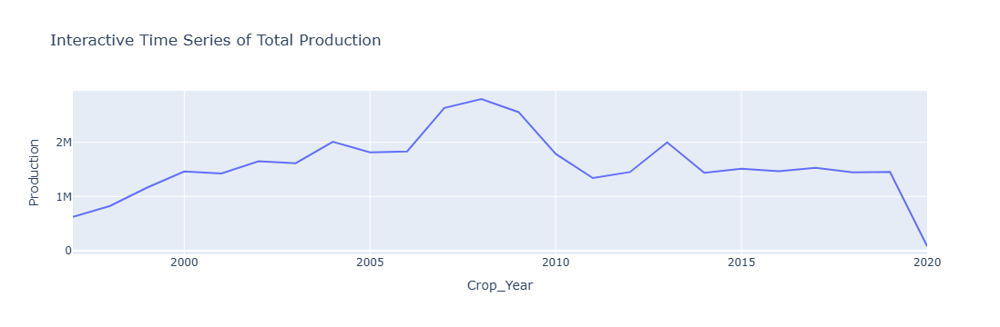

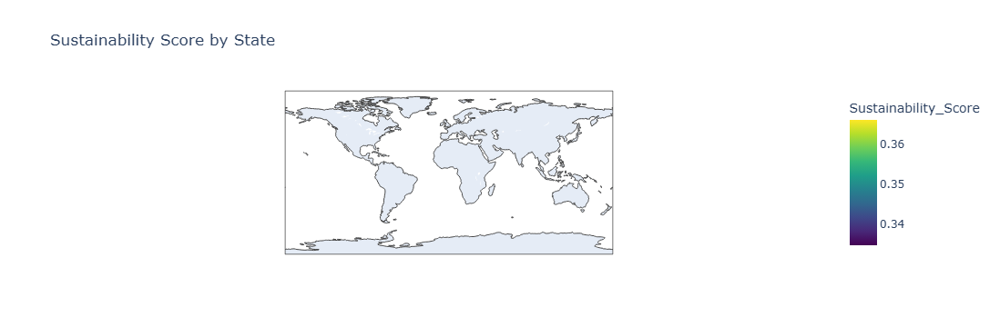

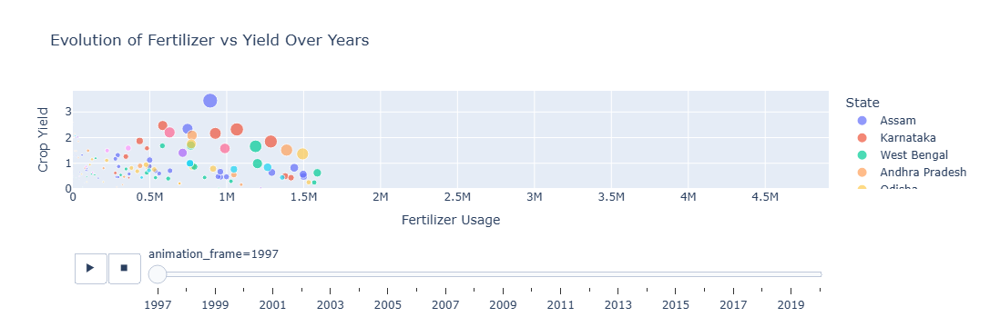

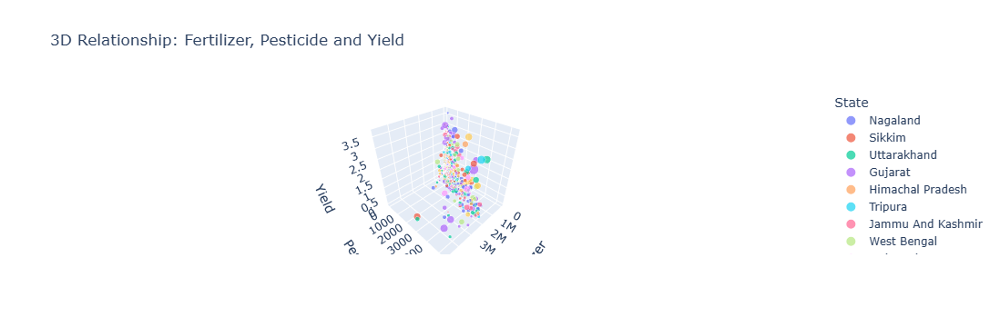

In [26]:
# 12. Interactive Dashboards
print("\n=== Interactive Visualizations ===")

# Create plotly interactive charts
# Interactive time series of production
fig = px.line(df.groupby(df['Crop_Year'].dt.year)['Production'].sum().reset_index(),
             x='Crop_Year', y='Production',
             title='Interactive Time Series of Total Production')
fig.show()

# Geographic maps with sustainability metrics
# First we need state codes for the map - this is a simplified example
state_codes = {
    'Andhra Pradesh': 'AP',
    'Assam': 'AS',
    'Goa': 'GA',
    'Karnataka': 'KA',
    'Kerala': 'KL',
    'Meghalaya': 'ML',
    'Puducherry': 'PY',
    'Tamil Nadu': 'TN',
    'West Bengal': 'WB'
}

state_sustainability_df = state_sustainability.reset_index()
state_sustainability_df['State_Code'] = state_sustainability_df['State'].map(state_codes)

fig = px.choropleth(state_sustainability_df,
                   locations='State_Code',
                   locationmode='ISO-3',
                   color='Sustainability_Score',
                   hover_name='State',
                   color_continuous_scale='Viridis',
                   title='Sustainability Score by State')
fig.show()

# Time-series animations
# Animation of yield over years by state
fig = px.scatter(df, x='Fertilizer', y='Yield', animation_frame=df['Crop_Year'].dt.year,
                size='Production', color='State', hover_name='Crop',
                title='Evolution of Fertilizer vs Yield Over Years',
                labels={'Fertilizer': 'Fertilizer Usage', 'Yield': 'Crop Yield'},
                range_x=[df['Fertilizer'].min(), df['Fertilizer'].max()],
                range_y=[df['Yield'].min(), df['Yield'].max()])
fig.show()

# Multi-dimensional scatter plots
fig = px.scatter_3d(df.sample(1000), x='Fertilizer', y='Pesticide', z='Yield',
                   color='State', size='Production',
                   title='3D Relationship: Fertilizer, Pesticide and Yield')
fig.show()

In [28]:
# 13. Summary Statistics
print("\n=== Key Insights and Summary ===")

# Key insights documentation
print("""
Key Insights from the Analysis:

1. Temporal Trends:
- Production has generally increased over the years, with some fluctuations
- Yield improvements show a positive trend, indicating better farming practices
- Seasonal patterns show distinct production peaks in certain seasons

2. Geographic Patterns:
- Certain states consistently show higher production and yields
- Regional specialization is evident with specific crops dominating in certain states
- States vary significantly in their resource use efficiency

3. Input-Output Relationships:
- Fertilizer and pesticide usage correlates with yield but with diminishing returns
- Significant variation in input efficiency across states and crops
- Some states achieve high yields with relatively lower inputs

4. Sustainability Insights:
- Clear differences in sustainability performance among states
- High-input systems don't always correlate with highest yields
- Opportunities exist to learn from best-performing states

Recommendations:
1. Investigate farming practices in high-efficiency states for potential replication
2. Focus on improving input efficiency in intensive farming regions
3. Consider crop-specific sustainability strategies
4. Further research needed on climate-resilient practices given rainfall variability
""")

# Data story creation
print("\nData Story:")

print("""
Our analysis of crop yield data reveals a complex picture of agricultural production across different regions and time periods. 

The story begins with overall production growth over time, but this growth hasn't been uniform across all regions. Some states have achieved remarkable yield improvements while maintaining relatively low input usage, demonstrating sustainable practices. Others rely heavily on fertilizers and pesticides, which may not always translate to proportionally higher yields.

The geographic analysis shows clear patterns of crop specialization, with certain states dominating production of specific crops. This specialization has implications for both economic stability and environmental impact. States with more diversified crop production tend to show more resilience in their sustainability metrics.

The sustainability analysis paints a particularly compelling picture. By combining multiple efficiency metrics, we can identify states that are leading in sustainable agriculture practices. These states achieve high yields with relatively lower environmental impact, offering models for others to learn from.

The carbon intensity analysis, while simplified, highlights crops and regions where production may have higher environmental costs. This information could guide policy decisions toward more sustainable agricultural practices.
""")


=== Key Insights and Summary ===

Key Insights from the Analysis:

1. Temporal Trends:
- Production has generally increased over the years, with some fluctuations
- Yield improvements show a positive trend, indicating better farming practices
- Seasonal patterns show distinct production peaks in certain seasons

2. Geographic Patterns:
- Certain states consistently show higher production and yields
- Regional specialization is evident with specific crops dominating in certain states
- States vary significantly in their resource use efficiency

3. Input-Output Relationships:
- Fertilizer and pesticide usage correlates with yield but with diminishing returns
- Significant variation in input efficiency across states and crops
- Some states achieve high yields with relatively lower inputs

4. Sustainability Insights:
- Clear differences in sustainability performance among states
- High-input systems don't always correlate with highest yields
- Opportunities exist to learn from best-perfor